## Objective 

The primary objective of this project is to conduct a thorough analysis of ChatGPT reviews to extract valuable insights and identify key trends. This involves performing Exploratory Data Analysis (EDA) to examine the distribution and patterns of reviews and ratings. Additionally, sentiment analysis is employed to understand user sentiments expressed in comments, while trend analysis investigates changes over time. The project also focuses on evaluating how different versions of the app impact user feedback and ratings. Through visualizations and seasonal decomposition, the aim is to provide a comprehensive understanding of user experiences and application performance.

## Import Libraries

In [4]:
import pandas as pd 
import numpy as np 

In [6]:
# Data Visualization 
import matplotlib.pyplot as plt 
import seaborn as sns 

In [8]:
# warning remove alerts
import warnings
warnings.filterwarnings('ignore')

## Load the dataset

In [11]:
data = pd.read_csv('GPT_reviews.csv')

### Starting 5 rows 

In [14]:
# Display the first few rows of each dataset
data.head()

,Name,Rating,Comment,Date,Country,Thumbs Up,Review ID,App Version
0,Musa Maan,4,pictures information is not good but overall best,2024-07-18 18:19:22,us,0,4312ea55-28b5-4abd-b007-c0c4909c25bc,1.2024.192
1,Lorax,5,Very useful,2024-07-18 18:18:15,us,0,249e38e0-9d3a-4392-896d-88fd7e4499f6,NaN
2,Ramesh Singh,5,This app is very good for students who are str...,2024-07-18 18:18:00,us,0,d1ad5cbb-29c1-468b-8e00-31d82f4ee943,1.2024.192
3,Gurjaap Singh,3,limited chats😤,2024-07-18 18:15:15,us,0,6142e817-ac9a-4beb-aa8b-6ed8a273ed82,1.2024.157
4,Riya Sharma,3,i like this app very muchh ❤️❤️❤️,2024-07-18 18:11:52,us,0,10f2a957-df4c-4a2a-b71d-a5dfb54e2ed3,1.2024.192


### End 5 rows 

In [17]:
data.tail()

,Name,Rating,Comment,Date,Country,Thumbs Up,Review ID,App Version
99995,Martín Aurelio Mamani aviles,5,para laptop,2023-11-21 03:43:46,us,0,6b973659-26c4-40e6-8265-541a80af6f6f,1.2023.313
99996,Arko Roy,5,It is a wonderful app.It really help me in my ...,2023-11-21 03:42:07,us,0,609c1cd2-815c-40d8-b5f9-352084f4f67f,1.2023.313
99997,Aniket Paul,5,Most batter good app,2023-11-21 03:36:53,us,0,afa94f1c-7193-48a9-a012-b7f49d8c0844,1.2023.313
99998,Guru Guru,4,I think it is very good app. it help me alot b...,2023-11-21 03:35:24,us,0,d50fe21d-5bb3-427d-9b2c-71cbf4866e5f,1.2023.313
99999,Andy Dressler,3,I didnt find using this app at all special or ...,2023-11-21 03:13:27,us,0,4a04ce7e-94d3-42d7-bde8-c8e63acc1ffc,1.2023.313


## Information about data

### Shape

In [21]:
data.shape

(100000, 8)

### Size

In [24]:
data.size 

800000

### Columns 

In [27]:
data.columns

Index(['Name', 'Rating', 'Comment', 'Date', 'Country', 'Thumbs Up',
       'Review ID', 'App Version'],
      dtype='object')

### Info

In [30]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   Name         100000 non-null  object
 1   Rating       100000 non-null  int64 
 2   Comment      100000 non-null  object
 3   Date         100000 non-null  object
 4   Country      100000 non-null  object
 5   Thumbs Up    100000 non-null  int64 
 6   Review ID    100000 non-null  object
 7   App Version  93268 non-null   object
dtypes: int64(2), object(6)
memory usage: 6.1+ MB


### Dtypes

In [33]:
data.dtypes

Name           object
Rating          int64
Comment        object
Date           object
Country        object
Thumbs Up       int64
Review ID      object
App Version    object
dtype: object

In [35]:
# Convert 'Date' to datetime format
data['Date'] = pd.to_datetime(data['Date'])

In [37]:
data.dtypes

Name                   object
Rating                  int64
Comment                object
Date           datetime64[ns]
Country                object
Thumbs Up               int64
Review ID              object
App Version            object
dtype: object

### Check Duplicates

In [40]:
data.duplicated() 

0        False
1        False
2        False
3        False
4        False
         ...  
99995    False
99996    False
99997    False
99998    False
99999    False
Length: 100000, dtype: bool

In [42]:
data[data.duplicated()]     # To check row wise and detect the Duplicate rows

,Name,Rating,Comment,Date,Country,Thumbs Up,Review ID,App Version


### Check Null Values 

In [45]:
data.isnull().sum()

Name              0
Rating            0
Comment           0
Date              0
Country           0
Thumbs Up         0
Review ID         0
App Version    6732
dtype: int64

#### Handle Missing Values 

In [48]:
data['App Version'].fillna('Unknown', inplace=True)

In [50]:
print(data.isnull().sum())

Name           0
Rating         0
Comment        0
Date           0
Country        0
Thumbs Up      0
Review ID      0
App Version    0
dtype: int64


### Summary Statistics

In [53]:
summary_stats = data.describe()
print(summary_stats)

              Rating                           Date     Thumbs Up
count  100000.000000                         100000  100000.00000
mean        4.454870  2024-04-09 05:29:12.223639808       0.74087
min         1.000000            2023-11-21 03:13:27       0.00000
25%         4.000000  2024-02-21 12:13:02.249999872       0.00000
50%         5.000000            2024-04-18 20:52:04       0.00000
75%         5.000000  2024-05-31 17:43:22.750000128       0.00000
max         5.000000            2024-07-18 18:19:22    1712.00000
std         1.130432                            NaN      17.62071


## Exploratory Data Analysis (EDA)

### 1. Frequency of Ratings

In [57]:
rating_counts = data['Rating'].value_counts()
print(rating_counts)

Rating
5    74403
4    12377
1     6883
3     4407
2     1930
Name: count, dtype: int64


### 2. Top Reviewers by Number of Reviews

In [60]:
top_reviewers = data['Name'].value_counts().head(10)
print(top_reviewers)

Name
Amit Kumar        23
Anonymous User    23
Manoj Kumar       20
Shivam Kumar      19
Deepak Kumar      18
Rohit Kumar       18
Alex              18
Michael           17
Abhishek Kumar    17
Sachin Kumar      16
Name: count, dtype: int64


### 3. Reviews Count by Country

In [63]:
reviews_per_country = data['Country'].value_counts()
print(reviews_per_country)

Country
us    100000
Name: count, dtype: int64


### 4. Reviews Count by App Version

In [66]:
reviews_per_version = data['App Version'].value_counts()
print(reviews_per_version)

App Version
Unknown       6732
1.2024.073    6692
1.2024.131    5699
1.2024.080    5442
1.2024.170    5232
              ... 
1.2024.059       2
1.2024.033       1
1.2023.270       1
1.2023.306       1
1.2023.298       1
Name: count, Length: 69, dtype: int64


### 5. Average Rating by Country

In [69]:
avg_rating_country = data.groupby('Country')['Rating'].mean()
print(avg_rating_country)

Country
us    4.45487
Name: Rating, dtype: float64


### 6. Average Rating by App Version

In [72]:
avg_rating_version = data.groupby('App Version')['Rating'].mean()
print(avg_rating_version)

App Version
1.0.0016      4.000000
1.0.0022      3.000000
1.0.0023      4.454545
1.0.0026      3.222222
1.0.0030      5.000000
                ...   
1.2024.170    4.522554
1.2024.177    4.510495
1.2024.191    4.398148
1.2024.192    4.282667
Unknown       3.817885
Name: Rating, Length: 69, dtype: float64


### 7. Review Count by App Version Over Time

In [75]:
data['Date'] = pd.to_datetime(data['Date'])
reviews_by_version_date = data.groupby(['Date', 'App Version']).size().unstack()
print(reviews_by_version_date)

App Version          1.0.0016  1.0.0022  1.0.0023  1.0.0026  1.0.0030  \
Date                                                                    
2023-11-21 03:13:27       NaN       NaN       NaN       NaN       NaN   
2023-11-21 03:35:24       NaN       NaN       NaN       NaN       NaN   
2023-11-21 03:36:53       NaN       NaN       NaN       NaN       NaN   
2023-11-21 03:42:07       NaN       NaN       NaN       NaN       NaN   
2023-11-21 03:43:46       NaN       NaN       NaN       NaN       NaN   
...                       ...       ...       ...       ...       ...   
2024-07-18 18:11:52       NaN       NaN       NaN       NaN       NaN   
2024-07-18 18:15:15       NaN       NaN       NaN       NaN       NaN   
2024-07-18 18:18:00       NaN       NaN       NaN       NaN       NaN   
2024-07-18 18:18:15       NaN       NaN       NaN       NaN       NaN   
2024-07-18 18:19:22       NaN       NaN       NaN       NaN       NaN   

App Version          1.0.0031  1.0.0032  1.0.0035 

### 8. Sentiment Analysis of Comments

In [78]:
from textblob import TextBlob

In [79]:
data['Sentiment'] = data['Comment'].apply(lambda x: TextBlob(x).sentiment.polarity)

### 9. Sentiment Distribution

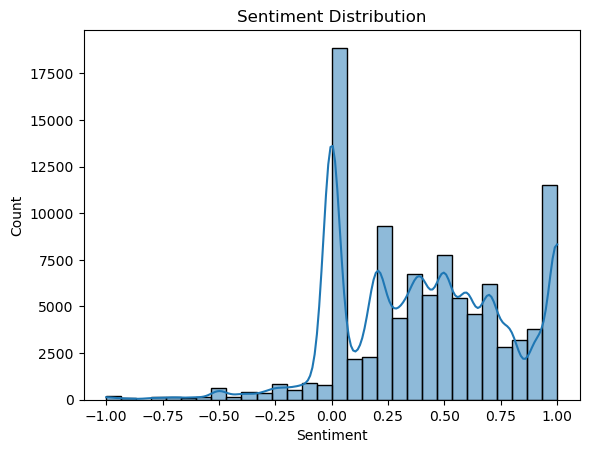

In [83]:
sns.histplot(data['Sentiment'], bins=30, kde=True)
plt.title('Sentiment Distribution')
plt.show()

### 10. Sentiment by Country

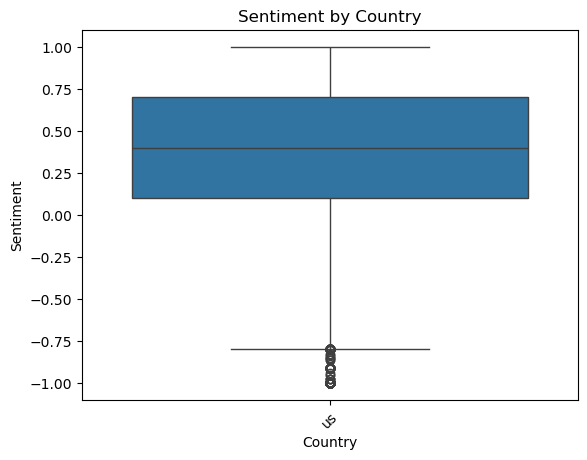

In [86]:
sns.boxplot(x='Country', y='Sentiment', data=data)
plt.xticks(rotation=45)
plt.title('Sentiment by Country')
plt.show()

### 11. Sentiment by App Version

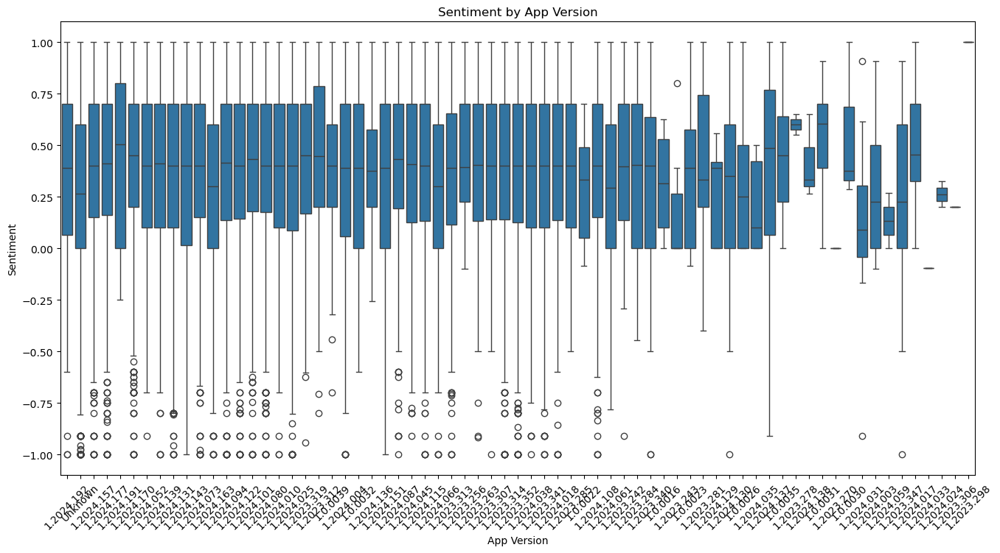

In [89]:
plt.figure(figsize=(16, 8))
sns.boxplot(x='App Version', y='Sentiment', data=data)
plt.xticks(rotation=45)
plt.title('Sentiment by App Version')
plt.show()

### 12. Correlation Between Thumbs Up and Rating

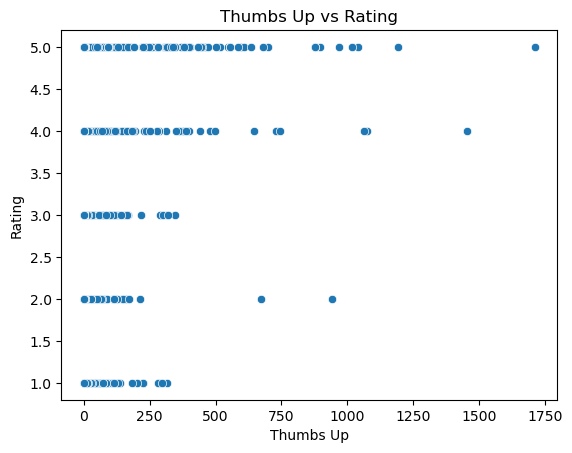

In [92]:
sns.scatterplot(x='Thumbs Up', y='Rating', data=data)
plt.title('Thumbs Up vs Rating')
plt.show()

### 13. Top Positive and Negative Reviews

In [95]:
data['Sentiment'] = data['Comment'].apply(lambda x: TextBlob(x).sentiment.polarity)
top_positive = data.nlargest(10, 'Sentiment')[['Name', 'Rating', 'Comment']]
top_negative = data.nsmallest(10, 'Sentiment')[['Name', 'Rating', 'Comment']]
print("Top Positive Reviews:\n", top_positive)
print("Top Negative Reviews:\n", top_negative)

Top Positive Reviews:
                     Name  Rating                                       Comment
7            Sosna Kifle       5                                 excellent app
23             Badal Das       5                            definitely awesome
36          Ravi Ahirwar       5                       superb quality and work
48       Shubhangi Anuse       5                    best app for information 👌
52  Brianna “Bria” Hayes       5  perfect for helping me write anything I need
53            ANKUR BERA       5                                Best AI Friend
62           Faiz Rushda       5                 best way to explore the world
67      OM PRAKASH KUMAR       5                       excellent performance 💯
77          Wahid Rajput       5                                 excellent app
83        Asha Dive Asha       5                the best app for students ❤️💝🌷
Top Negative Reviews:
                          Name  Rating  \
138              Nagraj Konda       1   
669

### 14. Review Length Analysis

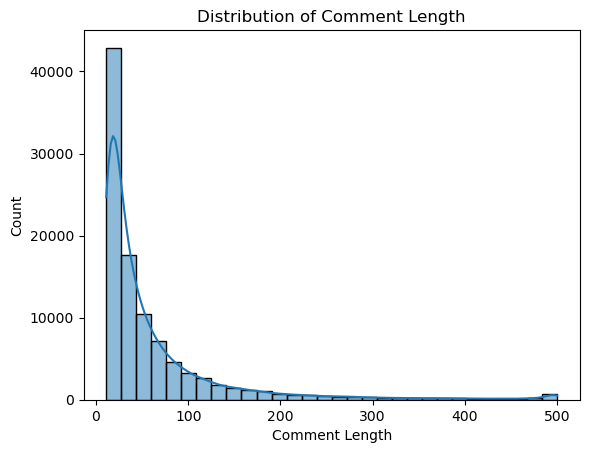

In [98]:
data['Comment Length'] = data['Comment'].apply(len)
sns.histplot(data['Comment Length'], bins=30, kde=True)
plt.title('Distribution of Comment Length')
plt.show()

### 15. Review Trends Over Time

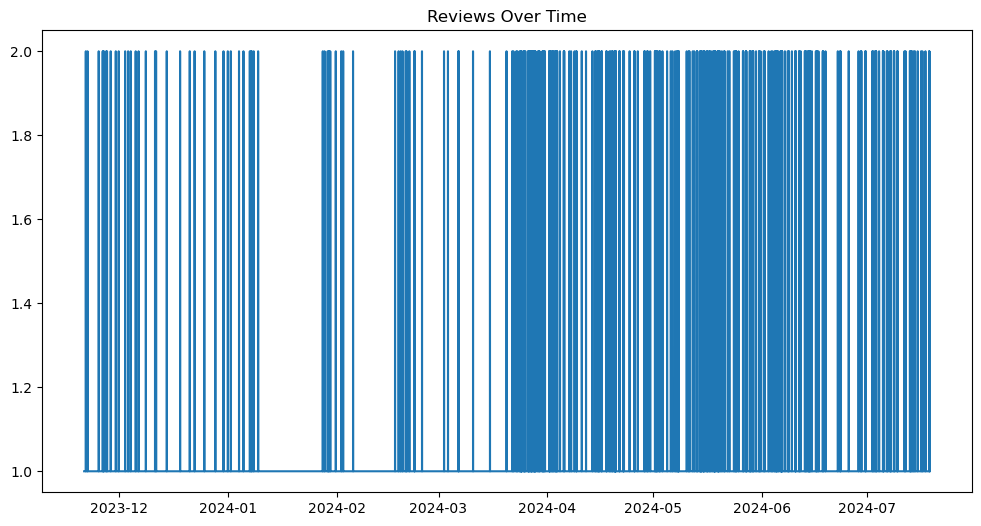

In [101]:
plt.figure(figsize=(12, 6))
reviews_by_date = data.groupby('Date').size()
plt.plot(reviews_by_date.index, reviews_by_date)
plt.title('Reviews Over Time')
plt.show()

### 16. Average Rating Over Time

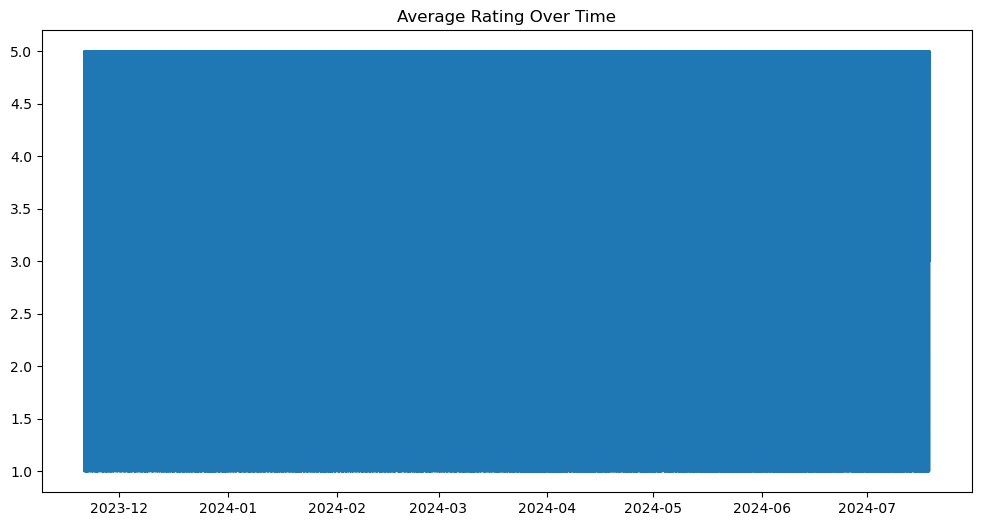

In [104]:
plt.figure(figsize=(12, 6))
avg_rating_by_date = data.groupby('Date')['Rating'].mean()
plt.plot(avg_rating_by_date.index, avg_rating_by_date)
plt.title('Average Rating Over Time')
plt.show()

### 17. Review Count by Day of the Week

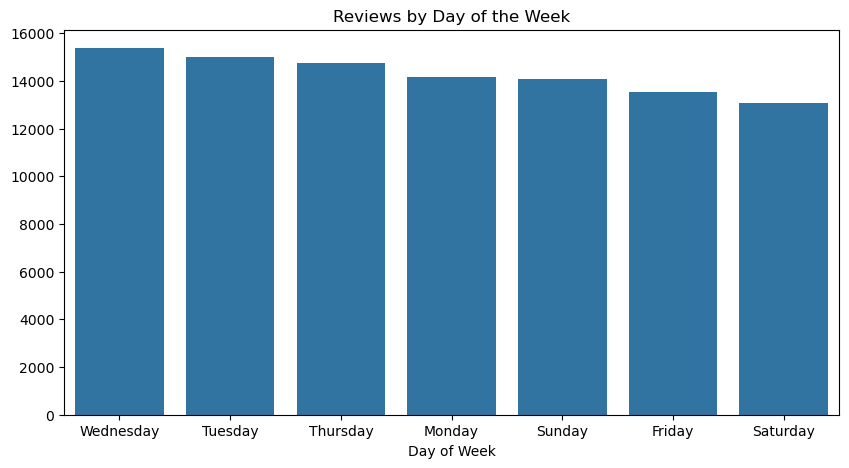

In [107]:
plt.figure(figsize=(10, 5))
data['Day of Week'] = data['Date'].dt.day_name()
reviews_by_day = data['Day of Week'].value_counts()
sns.barplot(x=reviews_by_day.index, y=reviews_by_day.values)
plt.title('Reviews by Day of the Week')
plt.show()

### 18. Review Count by Month

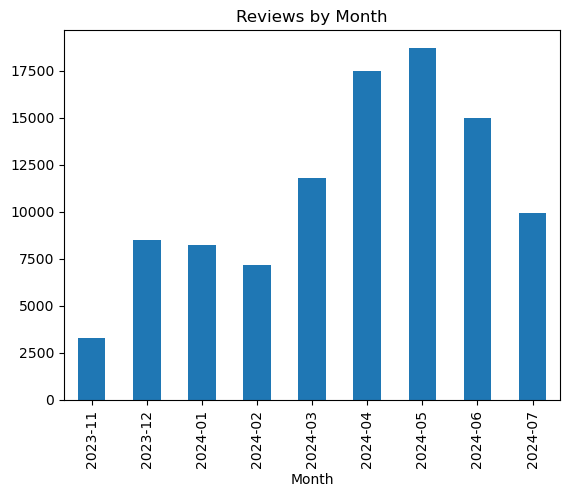

In [110]:
data['Month'] = data['Date'].dt.to_period('M')
reviews_by_month = data['Month'].value_counts().sort_index()
reviews_by_month.plot(kind='bar')
plt.title('Reviews by Month')
plt.show()

### 19. Ratings Distribution by Country

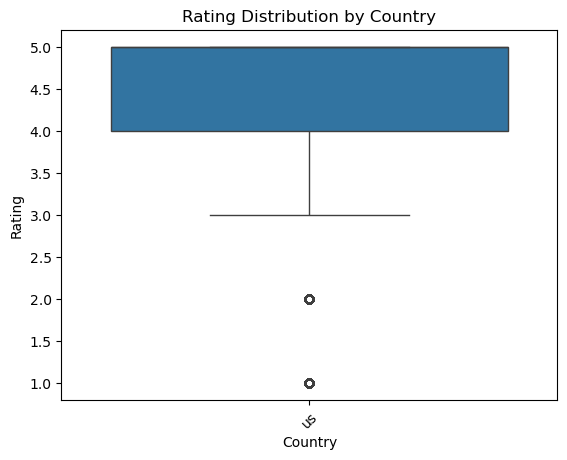

In [113]:
sns.boxplot(x='Country', y='Rating', data=data)
plt.xticks(rotation=45)
plt.title('Rating Distribution by Country')
plt.show()

### 20. Time Series Decomposition

In [116]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [118]:
# Group by 'Date' and count the number of reviews per day
reviews_by_date = data.groupby('Date').size()

In [120]:
# Set frequency for the index if it's not already set
reviews_by_date = reviews_by_date.asfreq('D', fill_value=0)

In [122]:
# Perform seasonal decomposition
decomposition = seasonal_decompose(reviews_by_date, model='additive')

<Figure size 1200x800 with 0 Axes>

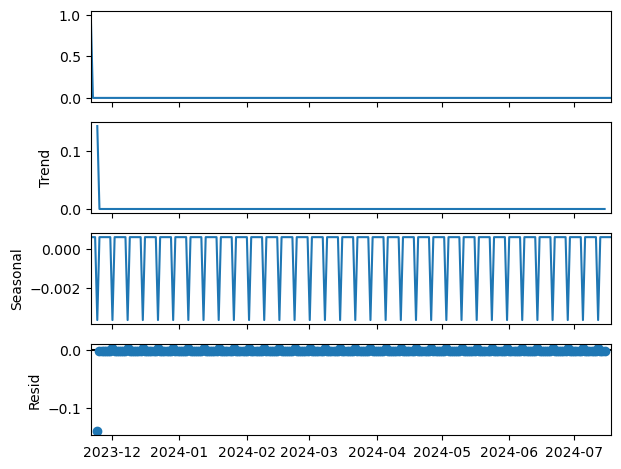

In [124]:
# Plot the decomposition
plt.figure(figsize=(12, 8))
decomposition.plot()
plt.show()

### 21. Sentiment Trends Over Time

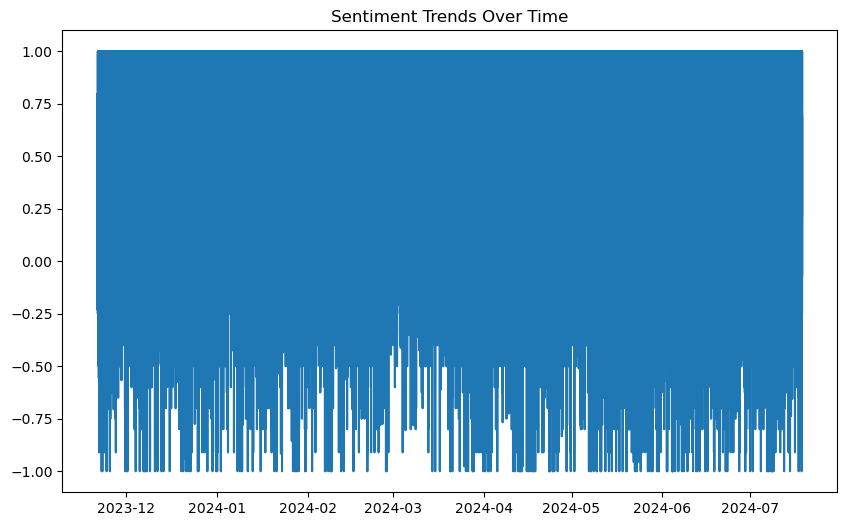

In [127]:
plt.figure(figsize=(10, 6))
sentiment_by_date = data.groupby('Date')['Sentiment'].mean()
plt.plot(sentiment_by_date.index, sentiment_by_date)
plt.title('Sentiment Trends Over Time')
plt.show()

### 22. Word Cloud of Comments

In [130]:
from wordcloud import WordCloud

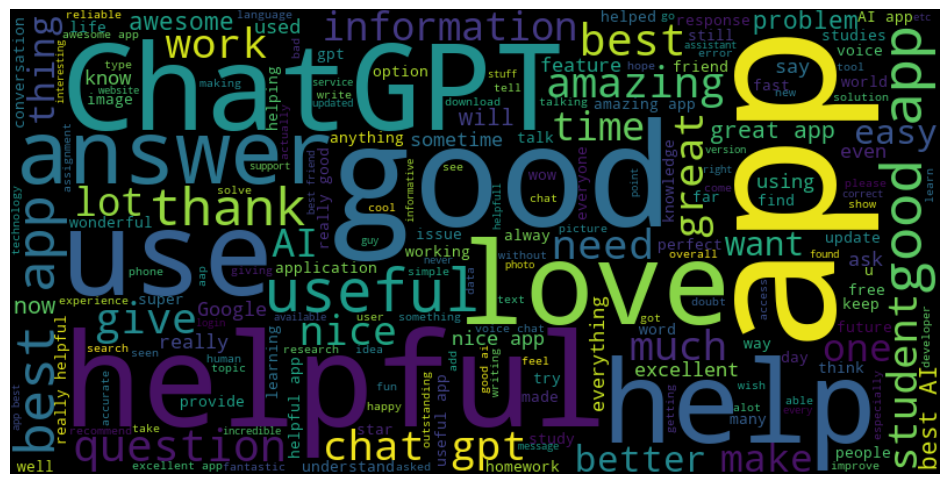

In [132]:
plt.figure(figsize=(12, 7))
comments_text = ' '.join(data['Comment'].dropna())
wordcloud = WordCloud(width=800, height=400).generate(comments_text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

### 23. Comparison of Ratings by App Version

In [135]:
avg_rating_per_version = data.groupby('App Version')['Rating'].mean().sort_values(ascending=False)

In [137]:
top_n_versions = avg_rating_per_version.head(10).index
filtered_data = data[data['App Version'].isin(top_n_versions)]

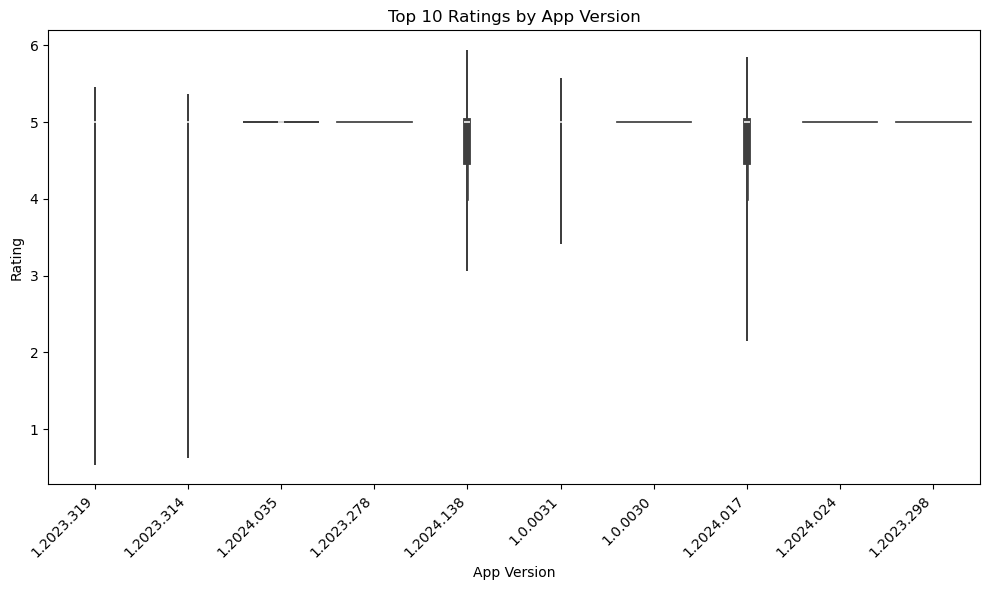

In [139]:
# Plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='App Version', y='Rating', data=filtered_data)
plt.xticks(rotation=45, ha='right')
plt.title('Top 10 Ratings by App Version')
plt.tight_layout()
plt.show()

#### Interactive Plot Using Plotly

In [142]:
import plotly.express as px

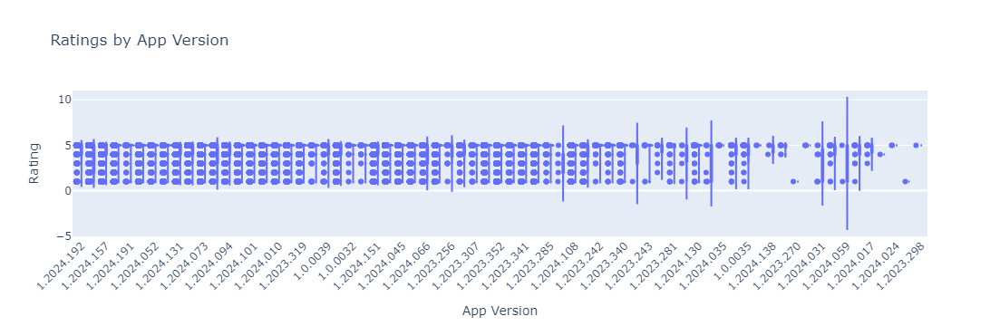

In [144]:
# Create interactive violin plot
fig = px.violin(data, x='App Version', y='Rating', box=True, points="all", title='Ratings by App Version')

fig.update_layout(xaxis_title='App Version', yaxis_title='Rating', xaxis_tickangle=-45)

# Show the plot
fig.show()

### 24. Heatmap of Review Counts by Country and App Version

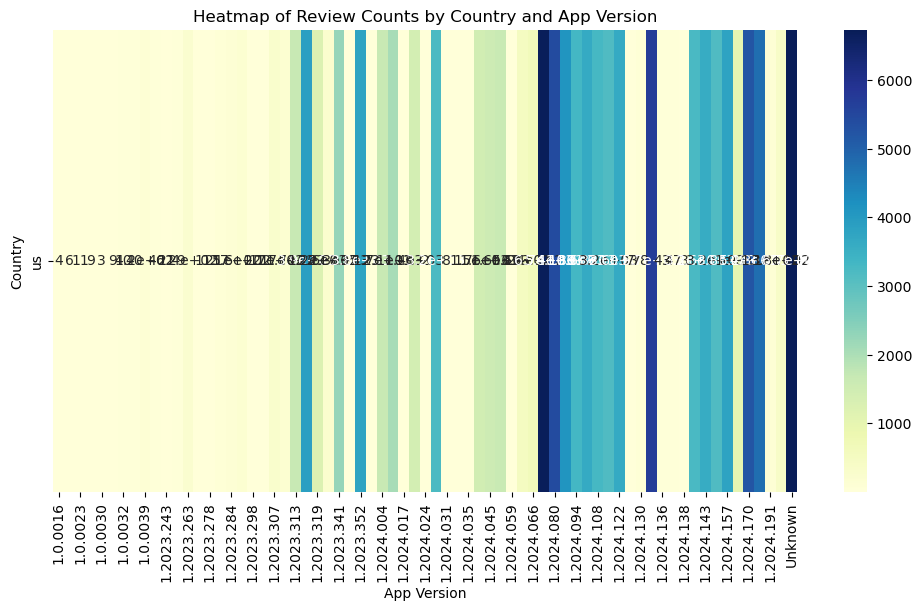

In [147]:
plt.figure(figsize=(12, 6))
review_counts = data.groupby(['Country', 'App Version']).size().unstack()
sns.heatmap(review_counts, annot=True, cmap='YlGnBu')
plt.title('Heatmap of Review Counts by Country and App Version')
plt.show()

### 25. Correlation Matrix of Numerical Features

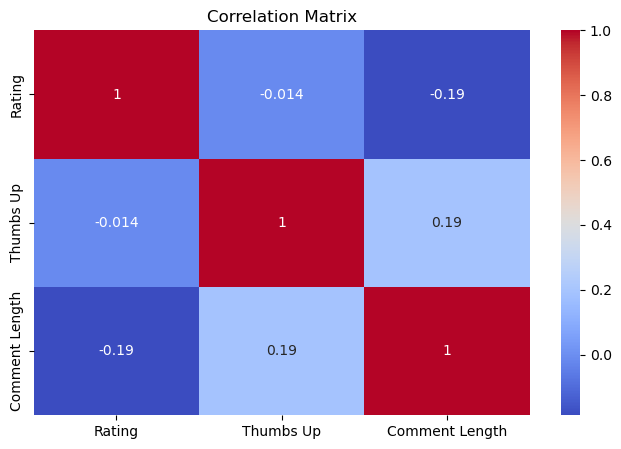

In [150]:
plt.figure(figsize=(8, 5))
correlation_matrix = data[['Rating', 'Thumbs Up', 'Comment Length']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

### 26. Topic Modeling on Comments

In [153]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [155]:
# Vectorization
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(data['Comment'])

In [157]:
# Topic Modeling
lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda.fit(X)

LatentDirichletAllocation(n_components=5, random_state=42)

### 27. Clustering of Reviews Based on Sentiment and Thumbs Up

In [160]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [162]:
# Feature Selection
features = data[['Sentiment', 'Thumbs Up']]
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

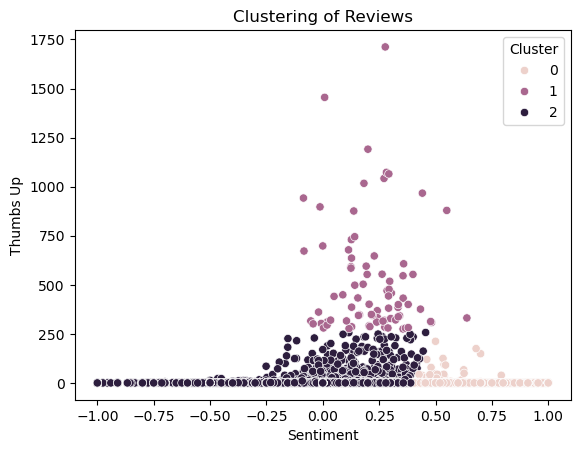

In [164]:
# Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
data['Cluster'] = kmeans.fit_predict(features_scaled)
sns.scatterplot(x='Sentiment', y='Thumbs Up', hue='Cluster', data=data)
plt.title('Clustering of Reviews')
plt.show()

### 28. Review Distribution by App Version and Country

<Figure size 1400x800 with 0 Axes>

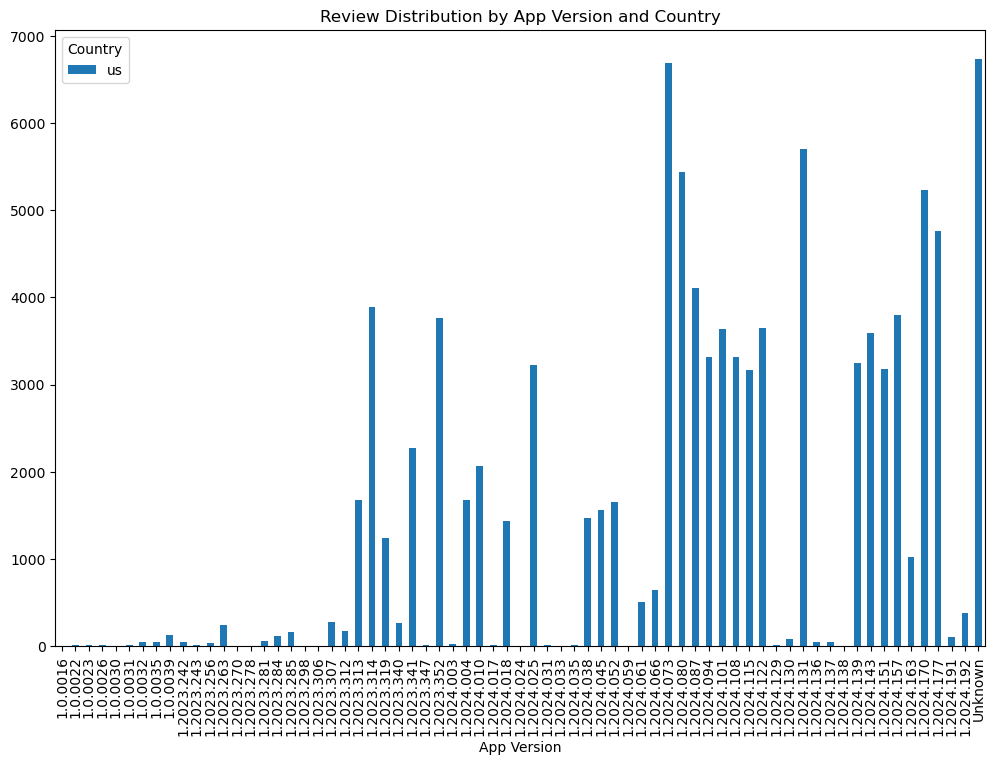

In [167]:
plt.figure(figsize=(14, 8))
review_dist = data.groupby(['App Version', 'Country']).size().unstack()
review_dist.plot(kind='bar', stacked=True, figsize=(12, 8))
plt.title('Review Distribution by App Version and Country')
plt.show()

### 29. Influence of App Version on Sentiment

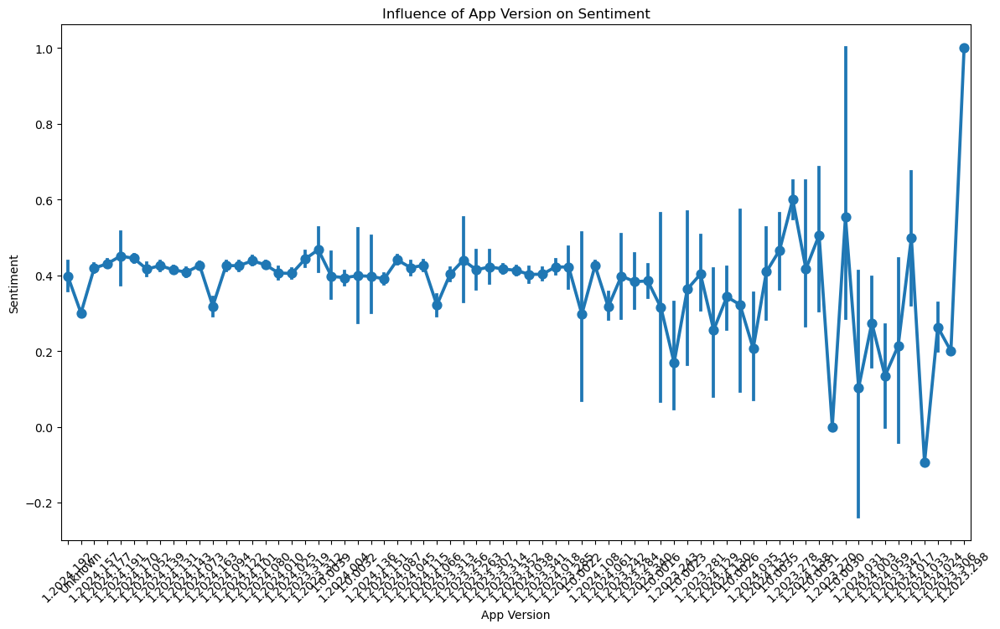

In [170]:
plt.figure(figsize=(14, 8))
sns.pointplot(x='App Version', y='Sentiment', data=data, estimator='mean')
plt.xticks(rotation=45)
plt.title('Influence of App Version on Sentiment')
plt.show()

### 30. Comparing Ratings and Sentiments by Different Countries

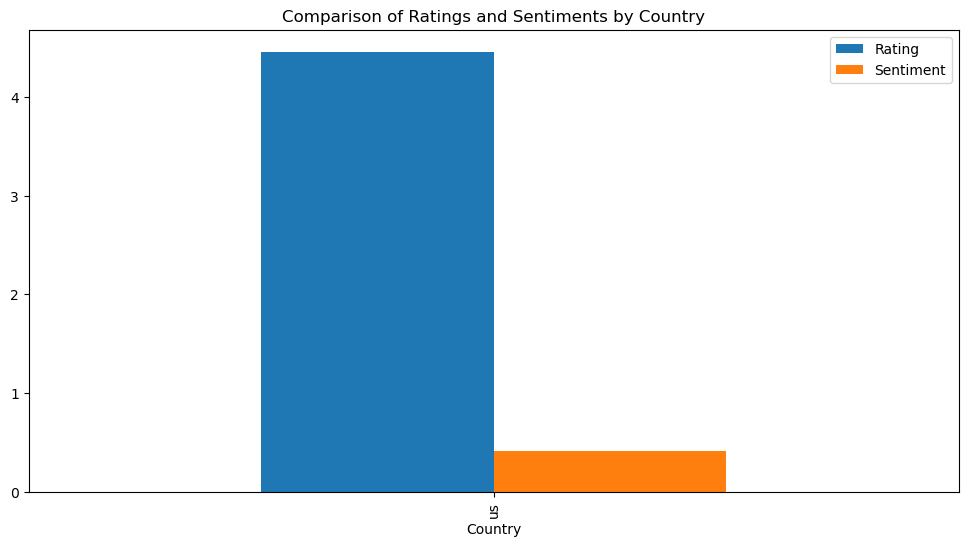

In [173]:
comparison_data = data.groupby('Country').agg({'Rating': 'mean', 'Sentiment': 'mean'})
comparison_data.plot(kind='bar', figsize=(12, 6))
plt.title('Comparison of Ratings and Sentiments by Country')
plt.show()

### 31. Time Between Reviews Analysis

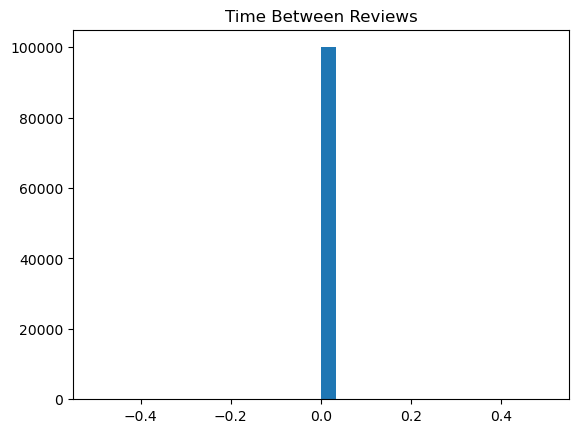

In [176]:
data.sort_values('Date', inplace=True)
data['Time Between Reviews'] = data['Date'].diff().dt.days
plt.hist(data['Time Between Reviews'].dropna(), bins=30)
plt.title('Time Between Reviews')
plt.show()

### 32. Analysis of Rating Distribution Before and After Major Updates

In [179]:
update_version = '2.0'
before_update = data[data['App Version'] < update_version]['Rating']
after_update = data[data['App Version'] >= update_version]['Rating']

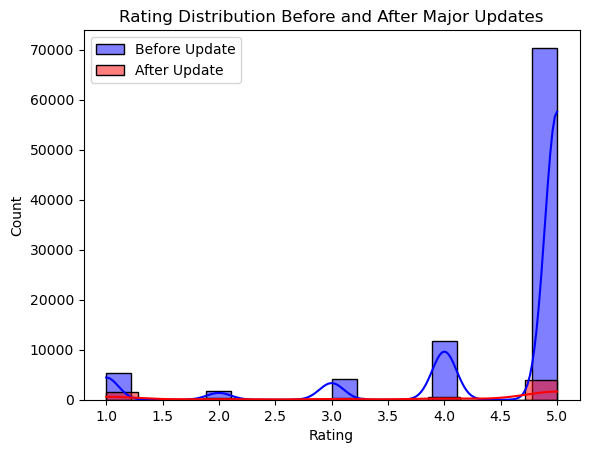

In [181]:
sns.histplot(before_update, label='Before Update', color='blue', kde=True)
sns.histplot(after_update, label='After Update', color='red', kde=True)
plt.title('Rating Distribution Before and After Major Updates')
plt.legend()
plt.show()

### 33. Review Count Analysis by Hour of Day

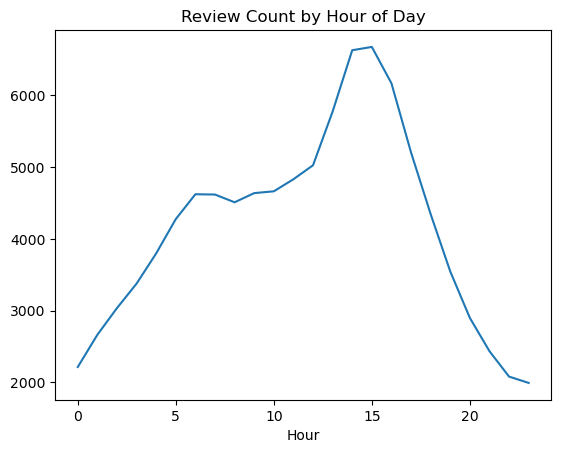

In [184]:
data['Hour'] = data['Date'].dt.hour
reviews_by_hour = data['Hour'].value_counts().sort_index()
sns.lineplot(x=reviews_by_hour.index, y=reviews_by_hour.values)
plt.title('Review Count by Hour of Day')
plt.show()

## Conclusion 

The analysis of ChatGPT reviews reveals several important findings. The distribution of ratings suggests a general trend towards higher user satisfaction, with positive feedback predominating. Sentiment analysis shows varying sentiments across different versions and time periods, offering insights into user perceptions and areas needing attention. Trend analysis uncovers fluctuations in review activity, potentially linked to app updates or external factors. By examining app versions, significant variations in user feedback are identified, indicating both successful improvements and areas for further development. Visualizations and seasonal decomposition provide a clear view of data patterns, helping predict future trends and enhance decision-making. Overall, this project delivers actionable insights to improve the application and better meet user expectations.